## Registering Drone Dataset for Detectron2 models

The dataset is available for download here: https://www.tugraz.at/index.php?id=22387. For the purposes of this notebook, the dataset has been reuploaded to S3, fully preserving it's folder structure. 

Let's download it locally.

In [ ]:
# check downloaded folder
! ls -al semantic_drone_dataset_2/

## Install Detectron2

To run this notebook, you will need to have detectron2 installed locally on notebook instance. In case of Sagemaker Managed Notebooks with GPU devices (e.g. p3 family), feel free to use install instructions below:
1. Open sepearate terminal window and run `source activate pytorch_p36` command.
2. Install newer version of gcc in order to compile detectron2 locally: `sudo yum install gcc72 gcc72-c++`
3. Select a new version of gcc to be default compiler: `sudo update-alternatives --config gcc`
3. `conda install pytorch torchvision -c pytorch`
4. `pip install 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'`
5. `pip install 'git+https://github.com/facebookresearch/fvcore'`
6. `export FORCE_CUDA="1"`
7. `export TORCH_CUDA_ARCH_LIST="Volta"` - assuming that you will use AWS EC2 P3 instances
8. `pip install 'git+https://github.com/facebookresearch/detectron2.git'`

In [ ]:
import detectron2 # check that detectron2 was properly installed

## Dataset preparations

Detectron2 includes set of utilities for dataloading and vizualization. However, before this, we need to convert drone dataset into one of supported formats. Most widely used format is COCO. In order to convert dataset to COCO format, we need to run converstion script `labelme_to_coco.py`.


In [ ]:
! python labelme_to_coco.py --dataset-dir semantic_drone_dataset_2/training_set --output semantic_drone_dataset_2

Once we have a processed file with annotations, let's upload it back to our S3 location as we will use it at training time.

In [ ]:
!aws s3 cp semantic_drone_dataset_2/train.json s3://d2-blog/semantic_drone_dataset_2/train.json

# Visualize Drone dataset

In [ ]:
! pip install google.colab # install image rendering package

In [ ]:
from detectron2.data.datasets import register_coco_instances
import os

dataset_name = "drone_train_1"
dataset_location = "./semantic_drone_dataset_2"
annotation_file = "train.json"
image_dir = "training_set/images"

register_coco_instances(dataset_name, {}, os.path.join(dataset_location, annotation_file), 
                        os.path.join(dataset_location, image_dir))

drone_meta = MetadataCatalog.get(dataset_name)

In [ ]:
# Print meta info
drone_meta

In [ ]:
dataset_dicts = DatasetCatalog.get(dataset_name)
print(dataset_dicts)

In [ ]:
import random
import cv2
from detectron2.utils.visualizer import Visualizer
from google.colab.patches import cv2_imshow
 
for d in random.sample(dataset_dicts, 3):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=drone_meta, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Fine tune Detectron2 model locally

In [ ]:
# Do initial configuration

config_file = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(config_file))
cfg.DATASETS.TRAIN = (dataset_name,)
cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(config_file)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = (
    1500
)  # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    32
)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

cfg.OUTPUT_DIR = "sem_seg_output"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [ ]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

In [ ]:
from detectron2.engine import DefaultPredictor

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = (dataset_name, )
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.utils.visualizer import ColorMode

im = cv2.imread("./semantic_drone_dataset_2/images/259.jpg")
outputs = predictor(im)

v = Visualizer(im[:, :, ::-1],
               metadata=drone_meta, 
               scale=0.8, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

## Fine tune Detectron2 model remotely

In [43]:
# Define IAM role
import boto3
import re

import os
import numpy as np
import pandas as pd
from sagemaker import get_execution_role

role = get_execution_role()

In [44]:
import sagemaker
from time import gmtime, strftime

sess = sagemaker.Session() # can use LocalSession() to run container locally

bucket = sess.default_bucket()
region = "us-east-2"
account = sess.boto_session.client('sts').get_caller_identity()['Account']
prefix_input = 'detectron2-input'
prefix_output = 'detectron2-ouput'

In [45]:
# loging to Sagemaker ECR with Deep Learning Containers
!aws ecr get-login-password --region us-east-2 | docker login --username AWS --password-stdin 763104351884.dkr.ecr.us-east-2.amazonaws.com
# loging to your private ECR
!aws ecr get-login-password --region us-east-2 | docker login --username AWS --password-stdin 553020858742.dkr.ecr.us-east-2.amazonaws.com

WARNING! Your password will be stored unencrypted in /home/ec2-user/.docker/config.json.
Configure a credential helper to remove this warning. See
https://docs.docker.com/engine/reference/commandline/login/#credentials-store

Login Succeeded
WARNING! Your password will be stored unencrypted in /home/ec2-user/.docker/config.json.
Configure a credential helper to remove this warning. See
https://docs.docker.com/engine/reference/commandline/login/#credentials-store

Login Succeeded


In [181]:
! ./build_and_push.sh d2-sm-drone distributed Dockerfile.dronetraining 

WARNING! Using --password via the CLI is insecure. Use --password-stdin.
WARNING! Your password will be stored unencrypted in /home/ec2-user/.docker/config.json.
Configure a credential helper to remove this warning. See
https://docs.docker.com/engine/reference/commandline/login/#credentials-store

Login Succeeded
Sending build context to Docker daemon  5.442GB
Step 1/17 : FROM 763104351884.dkr.ecr.us-east-2.amazonaws.com/pytorch-training:1.5.1-gpu-py36-cu101-ubuntu16.04
 ---> 2aa16a1b866d
Step 2/17 : LABEL author="vadimd@amazon.com"
 ---> Using cache
 ---> ca79c0c5133a
Step 3/17 : RUN pip install --upgrade --force-reinstall torch torchvision cython
 ---> Using cache
 ---> 31f386242737
Step 4/17 : RUN pip install 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
 ---> Using cache
 ---> 80b4b175c5bd
Step 5/17 : RUN pip install 'git+https://github.com/facebookresearch/fvcore'
 ---> Using cache
 ---> 6ddb12766ecc
Step 6/17 : ENV FORCE_CUDA="1"
 ---> Using cache
 ---> 

In [ ]:
!pygmentize -l docker Dockerfile.dronetraining

In [74]:
container = "d2-sm-drone" # your container name
tag = "distributed"
image = '{}.dkr.ecr.{}.amazonaws.com/{}:{}'.format(account, region, container, tag)

In [75]:
metric_definitions=[
    {
        "Name": "total_loss",
        "Regex": ".*total_loss:\s([0-9\\.]+)\s*"
    },
    {
        "Name": "loss_cls",
        "Regex": ".*loss_cls:\s([0-9\\.]+)\s*"
    },
    {
        "Name": "loss_box_reg",
        "Regex": ".*loss_box_reg:\s([0-9\\.]+)\s*"
    },
    {
        "Name": "loss_mask",
        "Regex": ".*loss_mask:\s([0-9\\.]+)\s*"
    },
    {
        "Name": "loss_rpn_cls",
        "Regex": ".*loss_rpn_cls:\s([0-9\\.]+)\s*"
    },
    {
        "Name": "loss_rpn_loc",
        "Regex": ".*loss_rpn_loc:\s([0-9\\.]+)\s*"
    }, 
    {
        "Name": "overall_training_speed",
        "Regex": ".*Overall training speed:\s([0-9\\.]+)\s*"
    },
    {
        "Name": "lr",  
        "Regex": ".*lr:\s([0-9\\.]+)\s*"
    },
    {
        "Name": "iter",  
        "Regex": ".*iter:\s([0-9\\.]+)\s*"
    }
]


In [182]:
hyperparameters = {"config-file":"COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml", 
                   #"local-config-file" : "config.yaml", # if you'd like to supply custom config file, please add it in container_training folder,
                                                         # and provide file name here
                   "resume":"True", # whether to re-use weights from pre-trained model
                  # opts are D2 model configuration as defined here: https://detectron2.readthedocs.io/modules/config.html#config-references
                  # this is a way to override individual parameters in D2 configuration from Sagemaker API
                   "opts": "SOLVER.MAX_ITER 2300 \
                   MODEL.ROI_HEADS.NUM_CLASSES 1\
                   SOLVER.REFERENCE_WORLD_SIZE 8"
                   }
    
d2 = sagemaker.estimator.Estimator(image_name=image,
                                   role=role,
                                   train_instance_count=4, 
                                   train_instance_type='ml.p3.16xlarge',
                                   train_volume_size=100,
                                   output_path="s3://{}/{}".format(sess.default_bucket(), prefix_output),
                                   metric_definitions = metric_definitions,
                                   hyperparameters = hyperparameters, 
                                   sagemaker_session=sagemaker.Session()
                                  )

d2.fit({'training':"s3://d2-blog/semantic_drone_dataset_2"},
       job_name = "drone-custom-4inst",
       wait=False) 

In [183]:
## Downloading weights from trained model
! aws s3 cp s3://sagemaker-us-east-2-553020858742/detectron2-ouput/drone-scaling-4inst-v11/output/model.tar.gz  model.tar.gz
## unarchiving model artifacts
! tar -xvf model.tar.gz

download: s3://sagemaker-us-east-2-553020858742/detectron2-ouput/drone-scaling-4inst-v11/output/model.tar.gz to ./model.tar.gz
model_final.pth
config.yaml
last_checkpoint


In [184]:
from detectron2.config import get_cfg

In [185]:
cfg = get_cfg()
cfg.merge_from_file("config.yaml")
cfg.MODEL.WEIGHTS = "model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = (dataset_name, )
cfg.freeze()

In [186]:
from detectron2.engine import DefaultPredictor
predictor = DefaultPredictor(cfg)

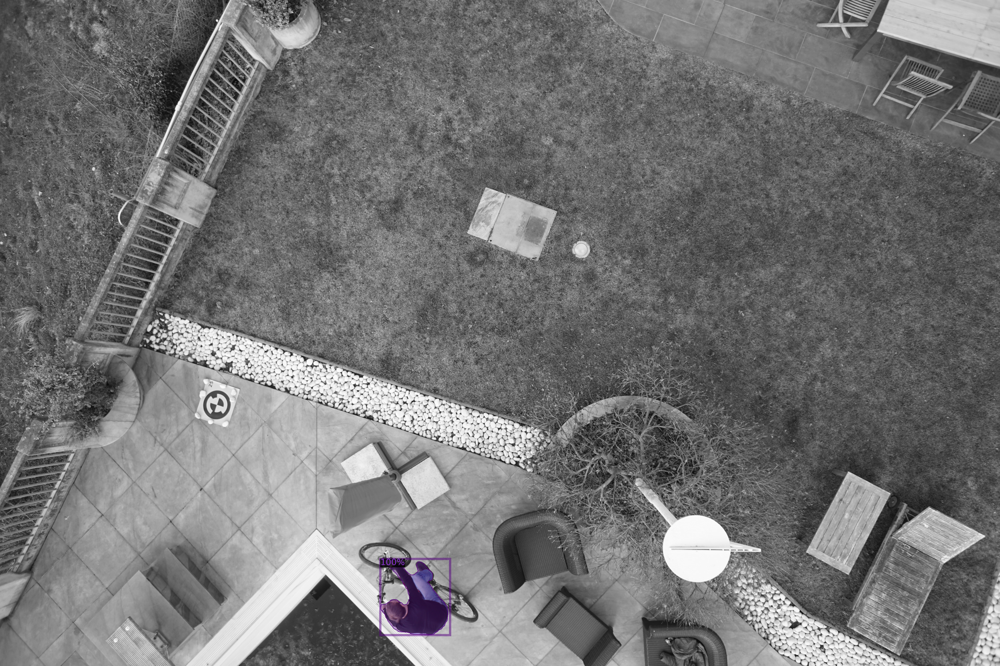

In [187]:
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import Visualizer

im = cv2.imread("./single_instance/semantic_drone_dataset_2/training_set/images/258.jpg")
outputs = predictor(im)

v = Visualizer(im[:, :, ::-1],
               metadata=drone_meta, 
               scale=0.8, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

## Testing on other aerial pictures

In [ ]:
! wget https://mymodernmet.com/wp/wp-content/uploads/2017/05/aerial-photography-amos-chapple-1.jpeg
! wget https://mymodernmet.com/wp/wp-content/uploads/2017/05/aerial-photography-Kacper-Kowalski-2.jpg
! wget https://i.pinimg.com/originals/f5/3d/7f/f53d7f4f9dda55801dcfc343fba72dc0.jpg

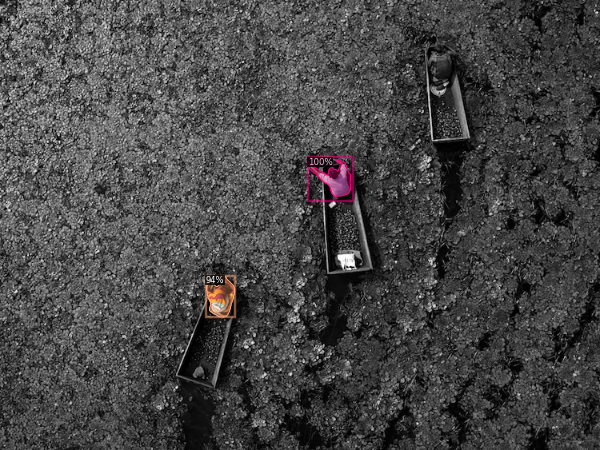

In [188]:
im = cv2.imread("aerial-photography-amos-chapple-1.jpeg")
# im = cv2.imread("aerial-photography-Kacper-Kowalski-2.jpg")
# im = cv2.imread("f53d7f4f9dda55801dcfc343fba72dc0.jpg")
outputs = predictor(im)

v = Visualizer(im[:, :, ::-1],
               metadata=drone_meta, 
               scale=0.8, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])